In [1]:
import os
import numpy as np
import scanpy as sc
from scipy.spatial import Delaunay
import scipy.sparse as sp
import pygsp as pg
from scipy.linalg import eigh
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, TwoSlopeNorm
import matplotlib as mpl
import gseapy as gp

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/paracrine_human_lymph_node/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

In [3]:
def delaunay(coords): 

    tri = Delaunay(coords)
    n_cells = len(coords)
    A = sp.lil_matrix((n_cells,n_cells), dtype=float)
    for simplex in tri.simplices: 
        for i in range(len(simplex)): 
            for j in range(len(simplex)): 
                A[simplex[i],simplex[j]] = 1 

    A = sp.csr_matrix(A)
    A.setdiag(0)

    return A

# Load

In [4]:
# Load
adata = sc.read_h5ad('/stanley/WangLab/kamal/data/technologies/xenium/human_lymph_node/formatted/adata.h5ad')

# Spatially arrange
adata.obsm['spatial'][:,1] *= -1

# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 6
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))

In [5]:
adata

AnnData object with n_obs × n_vars = 377985 × 377
    obs: 'transcript_counts'
    obsm: 'spatial'

In [6]:
adata.X.max()

79

In [7]:
adata.X.min()

0

In [8]:
sc.pp.filter_cells(adata, min_counts=1)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [9]:
tau = 5
filter_key = 'para'
coords = adata.obsm['spatial']
G = pg.graphs.Graph(delaunay(coords), lap_type='normalized')
G.estimate_lmax()
gpara = pg.filters.Filter(G, lambda x: np.exp(-tau*x) * np.sqrt(x))
X = np.array(adata.X.todense())
adata.layers[filter_key] = gpara.filter(X)

In [10]:
max_mag = 2

# Scale
sc.pp.scale(adata, layer=filter_key)

# Clip
X = adata.layers[filter_key]
X[X > max_mag] = max_mag
X[X < -max_mag] = -max_mag

# Plot filtered genes

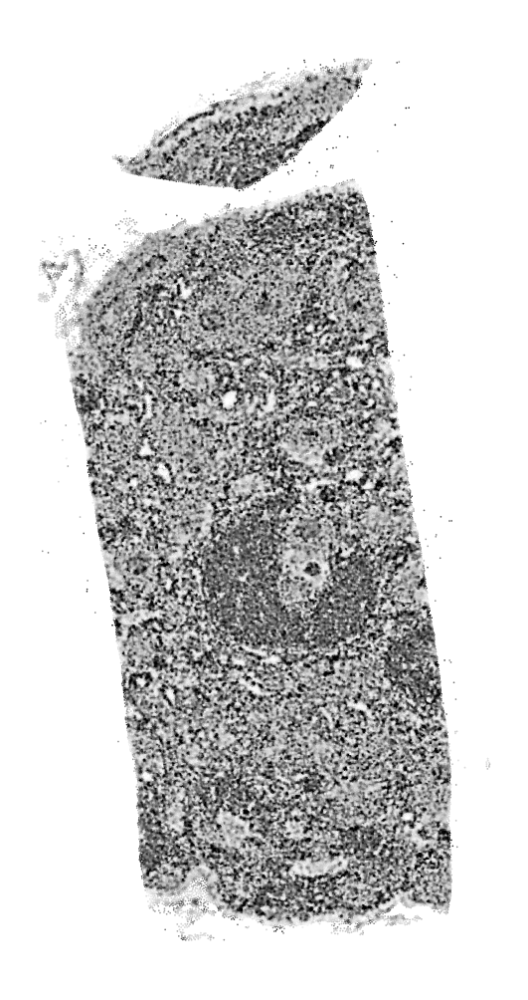

In [11]:
gene = 'TRAC'
points = adata.obsm['spatial']
plt.figure(figsize=(4,8))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=0.5,
    c=adata[:,[gene]].layers[filter_key].flatten(),
    cmap='Greys',
)
plt.axis('off')
filename = os.path.join(figpath, f'{gene}_{filter_key}_greys.png')
plt.savefig(filename, dpi=dpi)
plt.show()

# Calculate PCs

In [11]:
C = adata.layers[filter_key].T @ adata.layers[filter_key]
w,V = eigh(C)
w = w[::-1]
V = V[:,::-1]

# Plot multiple PCs

In [12]:
n_markers = 10

==================== PC1 ====================


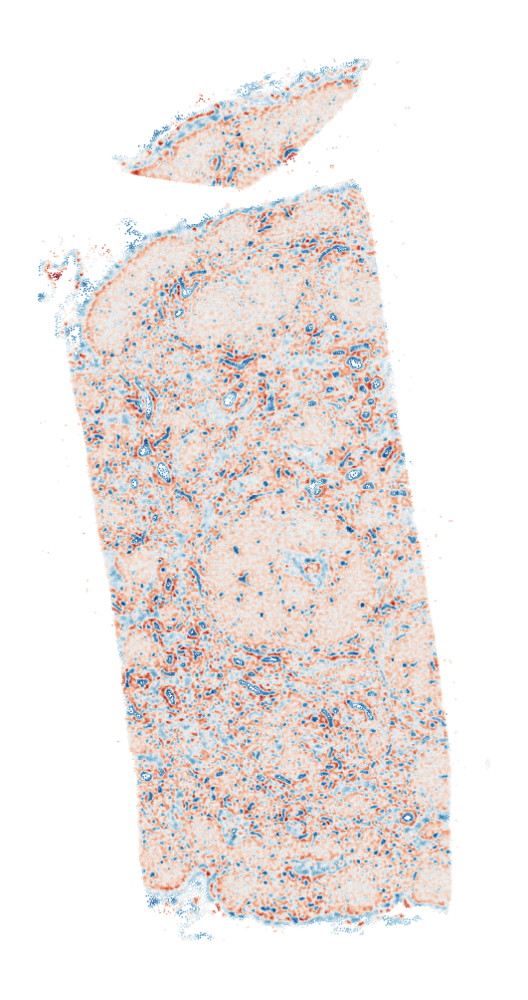

Positive markers:  ['PTPRC', 'CXCR4', 'TRAC', 'CYTIP', 'SELL', 'CD3E', 'CD3D', 'CCR7', 'CD2', 'CD28']
Negative markers:  ['CAVIN1', 'PECAM1', 'CD34', 'VWF', 'CD93', 'TFPI', 'EGFL7', 'GNG11', 'ADGRL4', 'ECSCR']



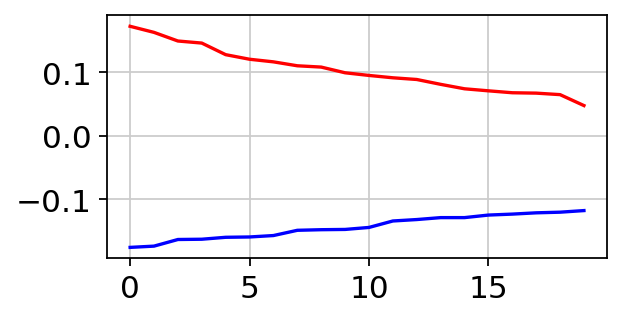

==================== PC2 ====================


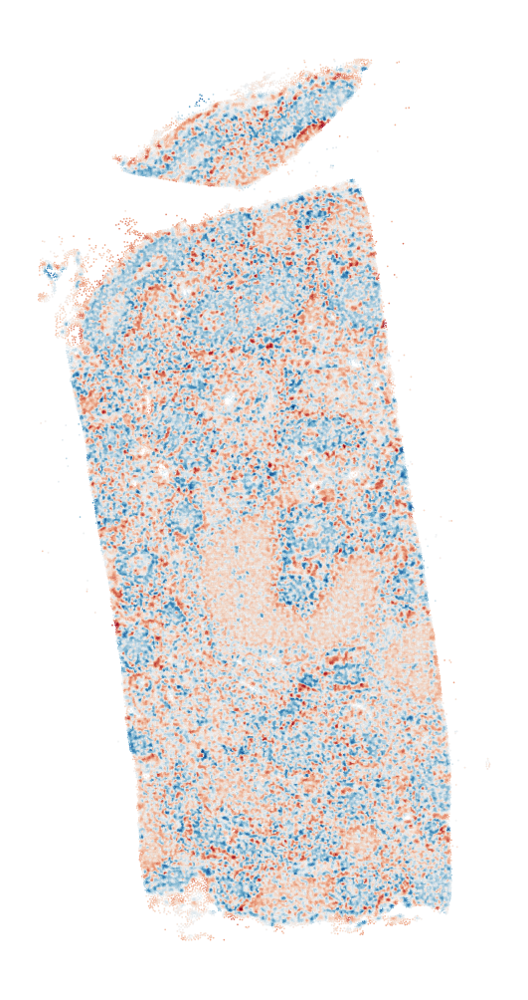

Positive markers:  ['TRAC', 'IL7R', 'CD3E', 'CD3D', 'CD2', 'CD28', 'CD247', 'CD4', 'CTLA4', 'CYTIP']
Negative markers:  ['MS4A1', 'BANK1', 'CD79A', 'CD19', 'PLCG2', 'ADAM28', 'IRF8', 'LY86', 'MEF2C', 'TNFRSF13B']



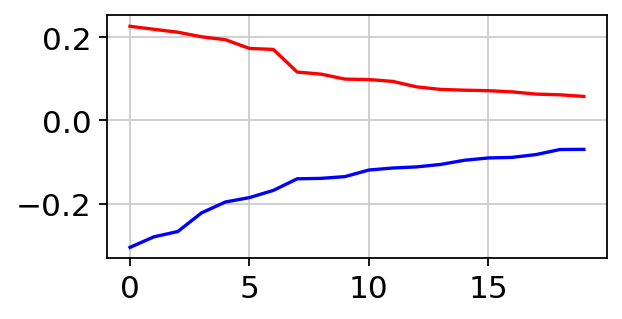

==================== PC3 ====================


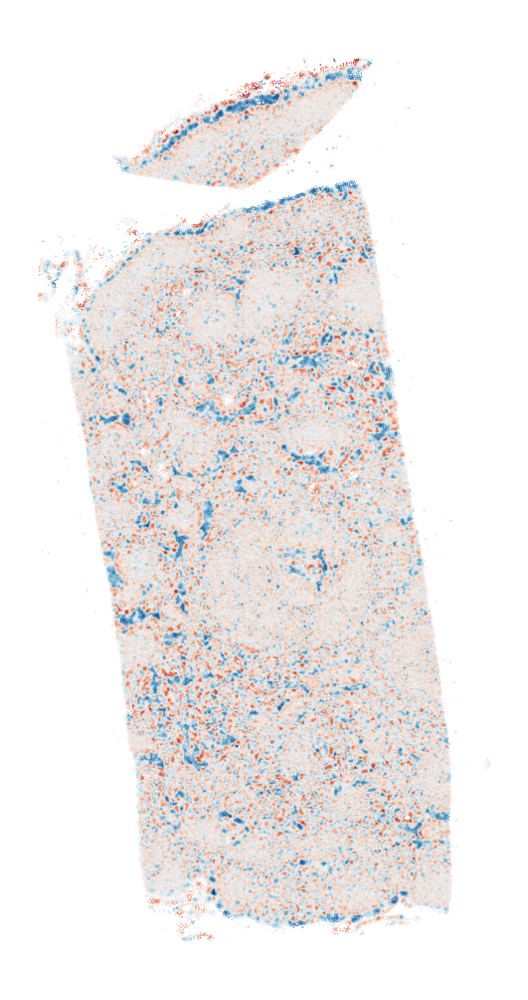

Positive markers:  ['CD34', 'IL7R', 'ADGRL4', 'VWF', 'TRAC', 'CXCR4', 'CLEC14A', 'MMRN2', 'CAVIN1', 'MYLK']
Negative markers:  ['AIF1', 'MS4A6A', 'FGL2', 'IGSF6', 'CD4', 'MPEG1', 'PLA2G7', 'CD68', 'MS4A4A', 'KCNMA1']



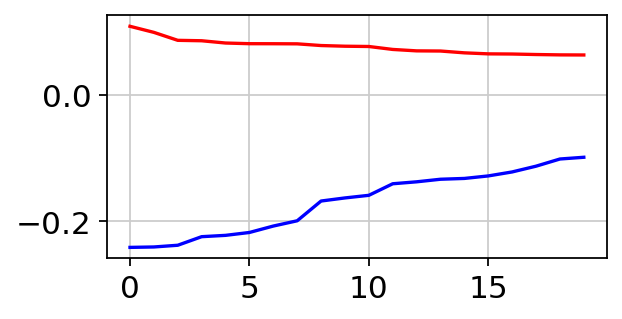

==================== PC4 ====================


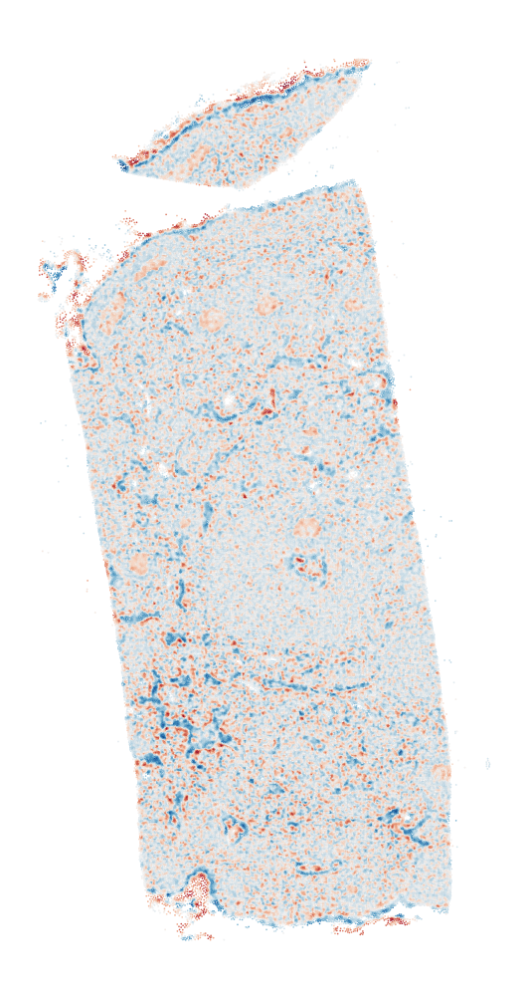

Positive markers:  ['PTGDS', 'C7', 'PDGFRB', 'PDGFRA', 'CTSK', 'PCOLCE', 'DPT', 'CCL19', 'MKI67', 'ADAMTS1']
Negative markers:  ['CAVIN2', 'PECAM1', 'PROX1', 'LYVE1', 'ECSCR', 'EGFL7', 'MMRN1', 'PTPRC', 'CXCL2', 'MARCO']



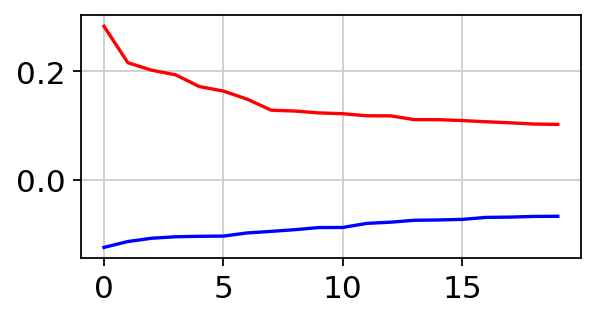

==================== PC5 ====================


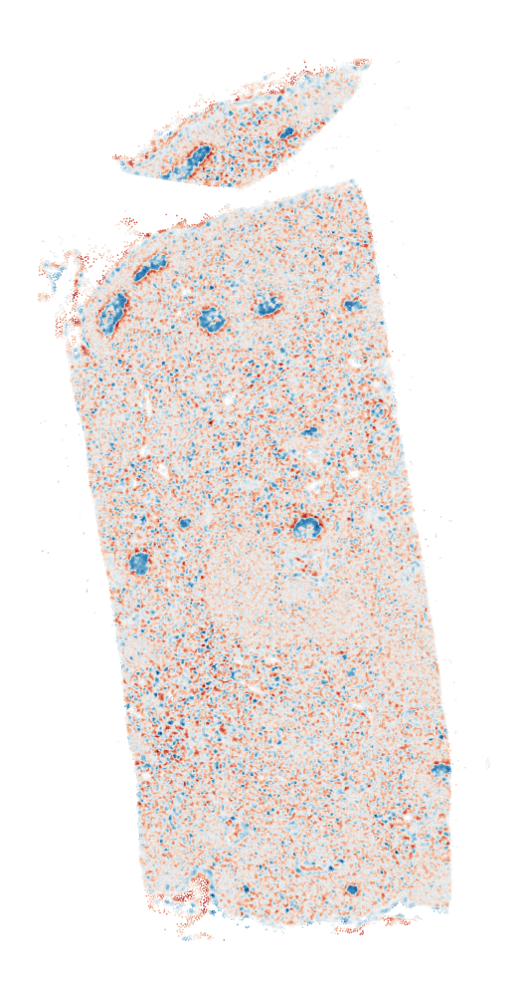

Positive markers:  ['PTGDS', 'C7', 'CXCR4', 'CTSK', 'PDGFRB', 'PDGFRA', 'IL7R', 'DPT', 'PCOLCE', 'CCR7']
Negative markers:  ['MKI67', 'PCNA', 'TOP2A', 'CDK1', 'CENPF', 'UBE2C', 'CCNB2', 'MZB1', 'TNFRSF17', 'SLAMF7']



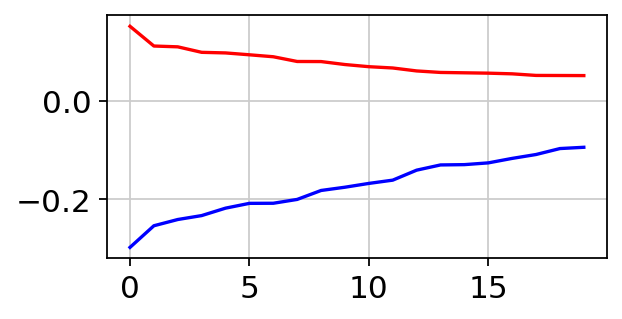

In [13]:
for i in range(5):

    print('='*20, f'PC{i+1}', '='*20)

    # Calculate PC
    c = adata.layers[filter_key] @ V[:,i]
    adata.obs[f'c{i}'] = c

    norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
    points = adata.obsm['spatial']
    plt.figure(figsize=(4,8))
    plt.scatter(
        points[:,0],
        points[:,1],
        edgecolor='k',
        linewidth=0.005,
        s=0.5,
        c=c,
        cmap='RdBu_r',
        norm=norm,
    )
    plt.axis('off')
    # filename = os.path.join(figpath, f'paracrine_pc{i+1}.png')
    # plt.savefig(filename, dpi=dpi)
    plt.show()
    
    # Print markers
    marker_idxs = np.argsort(V[:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))
    print()
    
    # Print weights
    plt.figure(figsize=(4,2))
    plt.plot(np.sort(V[:,i])[::-1][:20], c='r')
    plt.plot(np.sort(V[:,i])[:20], c='b')
    plt.show()

In [14]:
n_markers = 10
gene_sets = ['GO_Biological_Process_2023']
cutoff = 0.05
organism = 'Human'

for i in range(5):

    print('='*20, f'PC{i+1}', '='*20)
    
    marker_idxs = np.argsort(V[:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]

    enrichment = gp.enrichr(
        gene_list=list(pos_marker_genes),
        organism='Human',
        gene_sets=gene_sets,
    )
    try:
        df = enrichment.results
        display(df[['Term', 'Adjusted P-value', 'Genes']][df['Adjusted P-value'] < cutoff][:20])
        # fig = gp.barplot(df, title='Positive markers', group='Gene_set', color=['r'], cutoff=cutoff, size=10)
        # plt.show()
    except:
        print('No significant terms')

    enrichment = gp.enrichr(
        gene_list=list(neg_marker_genes),
        organism='Human',
        gene_sets=gene_sets,
    )
    try:
        df = enrichment.results
        display(df[['Term', 'Adjusted P-value', 'Genes']][df['Adjusted P-value'] < cutoff][:20])
        # fig = gp.barplot(df, title='Negative markers', group='Gene_set', color=['b'], cutoff=cutoff, size=10)
        # plt.show()
    except:
        print('No significant terms')

==================== PC1 ====================


,Term,Adjusted P-value,Genes
0,T Cell Activation (GO:0042110),1.261407e-09,CD2;PTPRC;CD28;CCR7;CD3E;CD3D
1,T Cell Receptor Signaling Pathway (GO:0050852),1.177545e-05,PTPRC;CD28;CD3E;CD3D
2,Positive Regulation Of T Cell Activation (GO:0...,1.268891e-05,PTPRC;CD28;CCR7;CD3E
3,Antigen Receptor-Mediated Signaling Pathway (G...,2.352638e-05,PTPRC;CD28;CD3E;CD3D
4,Positive Regulation Of T Cell Proliferation (G...,1.856625e-04,PTPRC;CD28;CD3E
5,Positive Regulation Of Lymphocyte Proliferatio...,2.213910e-04,PTPRC;CD28;CD3E
6,Regulation Of T Cell Proliferation (GO:0042129),2.213910e-04,PTPRC;CD28;CD3E
7,Positive Regulation Of Cytokine Production (GO...,3.755249e-04,CD2;PTPRC;CD28;CCR7
8,Alpha-Beta T Cell Activation (GO:0046631),5.650349e-04,CD3E;CD3D
9,Dendritic Cell Chemotaxis (GO:0002407),5.650349e-04,CXCR4;CCR7


,Term,Adjusted P-value,Genes
0,Glomerulus Vasculature Development (GO:0072012),0.000198,PECAM1;CD34
1,Endothelium Development (GO:0003158),0.000652,PECAM1;CD34
2,Phagocytosis (GO:0006909),0.015210,CD93;PECAM1
3,Positive Regulation Of Animal Organ Morphogene...,0.032431,CD34
4,Neutrophil Extravasation (GO:0072672),0.032431,PECAM1
5,Vascular Wound Healing (GO:0061042),0.032431,CD34
6,Hemostasis (GO:0007599),0.032431,VWF
7,Endocytosis (GO:0006897),0.032431,CD93;PECAM1
8,Regulation Of Angiogenesis (GO:0045765),0.032431,ECSCR;CD34
9,Positive Regulation Of Vasculogenesis (GO:2001...,0.032431,CD34


==================== PC2 ====================


,Term,Adjusted P-value,Genes
0,T Cell Activation (GO:0042110),6.464711e-10,CD2;CD4;CD28;CD247;CD3E;CD3D
1,T Cell Receptor Signaling Pathway (GO:0050852),3.305617e-08,CD28;CTLA4;CD247;CD3E;CD3D
2,Antigen Receptor-Mediated Signaling Pathway (G...,1.259544e-07,CD28;CTLA4;CD247;CD3E;CD3D
3,Alpha-Beta T Cell Activation (GO:0046631),1.255265e-06,CD247;CD3E;CD3D
4,Positive Regulation Of Interleukin-2 Productio...,1.650353e-03,CD4;CD28
5,T Cell Differentiation (GO:0030217),4.222885e-03,CD4;CD28
6,Regulation Of Interleukin-2 Production (GO:003...,4.222885e-03,CD4;CD28
7,Regulation Of T Cell Activation (GO:0050863),5.660587e-03,CD2;CD4
8,Positive Regulation Of Cytokine Production (GO...,5.660587e-03,CD2;CD4;CD28
9,Positive Regulation Of T Cell Proliferation (G...,5.660587e-03,CD28;CD3E


,Term,Adjusted P-value,Genes
0,B Cell Receptor Signaling Pathway (GO:0050853),3.442701e-09,CD79A;MEF2C;CD19;PLCG2;MS4A1
1,B Cell Activation (GO:0042113),6.116937e-08,CD79A;MEF2C;BANK1;PLCG2;MS4A1
2,B Cell Proliferation (GO:0042100),8.797852e-08,CD79A;MEF2C;CD19;MS4A1
3,Antigen Receptor-Mediated Signaling Pathway (G...,2.058279e-07,CD79A;MEF2C;CD19;PLCG2;MS4A1
4,Lymphocyte Proliferation (GO:0046651),4.032506e-05,CD79A;MEF2C;MS4A1
5,B Cell Differentiation (GO:0030183),1.980698e-04,CD79A;PLCG2;MS4A1
6,B Cell Homeostasis (GO:0001782),3.095310e-04,MEF2C;TNFRSF13B
7,Lymphocyte Differentiation (GO:0030098),3.579340e-04,CD79A;PLCG2;MS4A1
8,Negative Regulation Of B Cell Activation (GO:0...,1.266904e-03,TNFRSF13B;BANK1
9,Regulation Of B Cell Activation (GO:0050864),1.797946e-03,BANK1;CD19


==================== PC3 ====================


,Term,Adjusted P-value,Genes
0,Positive Regulation Of Cell Motility (GO:2000147),0.017496,CAVIN1;CXCR4;MYLK
1,Regulation Of Cell Migration (GO:0030334),0.026310,MMRN2;CXCR4;MYLK
2,Hemopoiesis (GO:0030097),0.026310,IL7R;CD34
3,Chemokine (C-X-C Motif) Ligand 12 Signaling Pa...,0.026310,CXCR4
4,Positive Regulation Of Animal Organ Morphogene...,0.026310,CD34
5,Glomerulus Vasculature Development (GO:0072012),0.026310,CD34
6,Hypotonic Response (GO:0006971),0.026310,MYLK
7,Cellular Hypotonic Response (GO:0071476),0.026310,MYLK
8,Negative Regulation Of Blood Vessel Endothelia...,0.026310,MMRN2
9,Bleb Assembly (GO:0032060),0.026310,MYLK


,Term,Adjusted P-value,Genes
0,Positive Regulation Of Mononuclear Cell Migrat...,0.013185,AIF1;PLA2G7
1,Positive Regulation Of Leukocyte Chemotaxis (G...,0.020164,AIF1;PLA2G7


==================== PC4 ====================


,Term,Adjusted P-value,Genes
0,Positive Regulation Of Phosphatidylinositol 3-...,0.000028,PDGFRB;PDGFRA;CCL19
1,Regulation Of Chemotaxis (GO:0050920),0.000028,PDGFRB;PDGFRA;CCL19
2,Positive Regulation Of Lipid Kinase Activity (...,0.000028,PDGFRB;PDGFRA;CCL19
3,Regulation Of Phosphatidylinositol 3-Kinase Ac...,0.000030,PDGFRB;PDGFRA;CCL19
4,Regulation Of Phospholipase C Activity (GO:190...,0.000563,PDGFRB;PDGFRA
5,Positive Regulation Of Kinase Activity (GO:003...,0.000607,PDGFRB;PDGFRA;CCL19
6,Cardiac Myofibril Assembly (GO:0055003),0.000671,PDGFRB;PDGFRA
7,Platelet-Derived Growth Factor Receptor Signal...,0.000671,PDGFRB;PDGFRA
8,Vasculature Development (GO:0001944),0.000681,PDGFRB;PDGFRA
9,Positive Regulation Of Phospholipase Activity ...,0.000970,PDGFRB;PDGFRA


,Term,Adjusted P-value,Genes
0,Blood Vessel Morphogenesis (GO:0048514),0.031923,EGFL7;PROX1
1,Phagocytosis (GO:0006909),0.031923,MARCO;PECAM1
2,Neutrophil Migration (GO:1990266),0.031923,PECAM1;CXCL2
3,Positive Regulation Of Endothelial Cell Prolif...,0.031923,EGFL7;PROX1
4,Positive Regulation Of Protein Phosphorylation...,0.031923,MARCO;PTPRC;PECAM1
5,Regulation Of Peptidyl-Tyrosine Phosphorylatio...,0.031923,PTPRC;PECAM1
6,Regulation Of Endothelial Cell Proliferation (...,0.031923,EGFL7;PROX1
7,Positive Regulation Of Epithelial Cell Prolife...,0.031923,EGFL7;PROX1
8,Positive Regulation Of Peptidyl-Tyrosine Phosp...,0.031923,PTPRC;PECAM1
9,Regulation Of Sarcomere Organization (GO:0060297),0.031923,PROX1


==================== PC5 ====================


,Term,Adjusted P-value,Genes
0,Positive Regulation Of Phosphatidylinositol 3-...,0.000028,PDGFRB;PDGFRA;CCR7
1,Regulation Of Chemotaxis (GO:0050920),0.000028,PDGFRB;PDGFRA;CXCR4
2,Positive Regulation Of Lipid Kinase Activity (...,0.000028,PDGFRB;PDGFRA;CCR7
3,Regulation Of Phosphatidylinositol 3-Kinase Ac...,0.000031,PDGFRB;PDGFRA;CCR7
4,Positive Regulation Of Cell Motility (GO:2000147),0.000135,PDGFRB;PDGFRA;CXCR4;CCR7
5,Regulation Of Phospholipase C Activity (GO:190...,0.000479,PDGFRB;PDGFRA
6,Positive Regulation Of Kinase Activity (GO:003...,0.000531,PDGFRB;PDGFRA;CCR7
7,Cardiac Myofibril Assembly (GO:0055003),0.000549,PDGFRB;PDGFRA
8,Platelet-Derived Growth Factor Receptor Signal...,0.000549,PDGFRB;PDGFRA
9,Dendritic Cell Chemotaxis (GO:0002407),0.000549,CXCR4;CCR7


,Term,Adjusted P-value,Genes
0,Mitotic Cell Cycle Phase Transition (GO:0044772),0.002017,CCNB2;UBE2C;CDK1
1,Nuclear Chromosome Segregation (GO:0098813),0.002017,TOP2A;CENPF
2,Regulation Of G2/M Transition Of Mitotic Cell ...,0.006635,CENPF;CDK1
3,Positive Regulation Of Mitotic Cell Cycle Phas...,0.016213,UBE2C;CDK1
4,Regulation Of Mitotic Cell Cycle Phase Transit...,0.024125,CENPF;UBE2C
5,Epithelial Cell Differentiation (GO:0030855),0.032020,PCNA;CDK1
6,Epithelium Development (GO:0060429),0.032020,PCNA;CDK1
7,Free Ubiquitin Chain Polymerization (GO:0010994),0.032020,UBE2C
8,Regulation Of Striated Muscle Tissue Developme...,0.032020,CENPF
9,DNA Ligation (GO:0006266),0.032020,TOP2A


### Save the "good ones"

In [16]:
# good_pcs = [0,3,4]
good_pcs = [0, 4]
n_markers = 5

==================== PC1 ====================


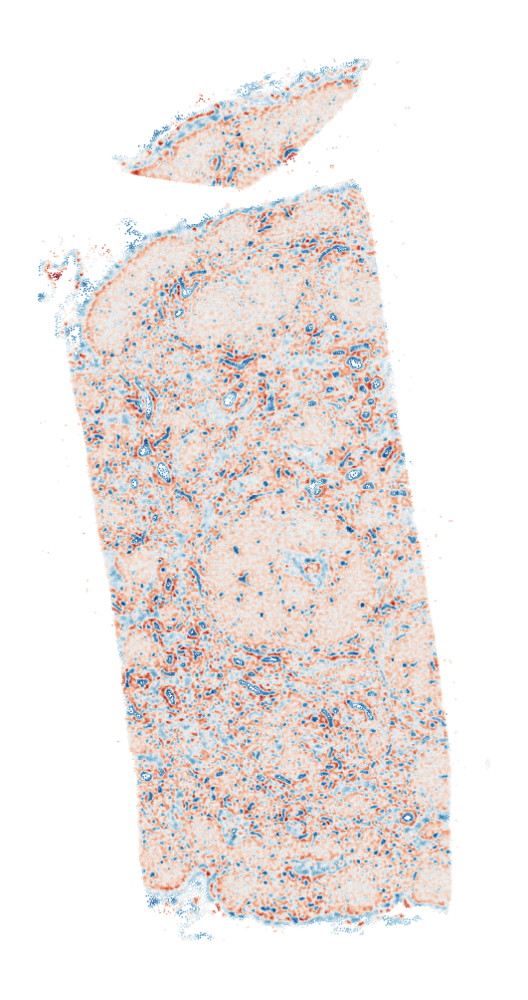

Positive markers:  ['PTPRC', 'CXCR4', 'TRAC', 'CYTIP', 'SELL']
Negative markers:  ['CAVIN1', 'PECAM1', 'CD34', 'VWF', 'CD93']

==================== PC5 ====================


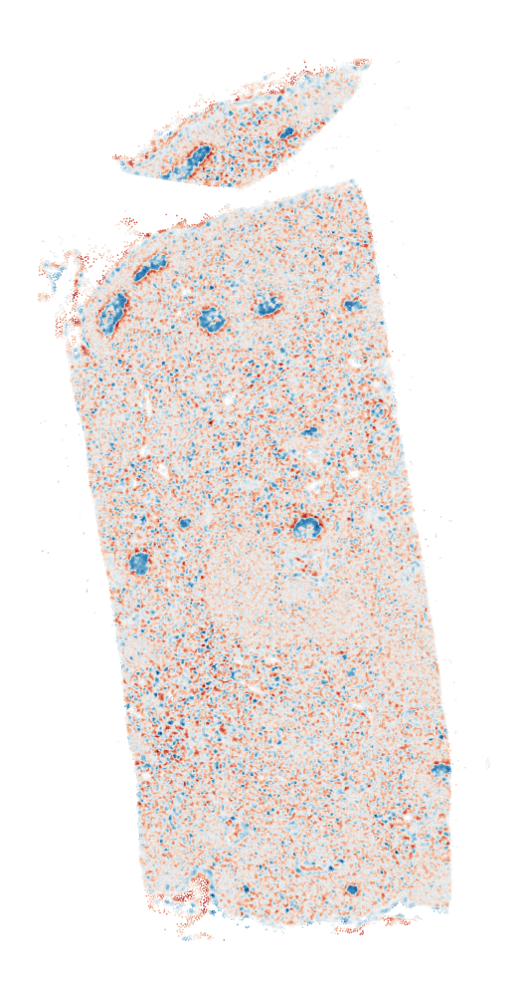

Positive markers:  ['PTGDS', 'C7', 'CXCR4', 'CTSK', 'PDGFRB']
Negative markers:  ['MKI67', 'PCNA', 'TOP2A', 'CDK1', 'CENPF']



In [17]:
for i in good_pcs:

    print('='*20, f'PC{i+1}', '='*20)

    # Calculate PC
    c = adata.layers[filter_key] @ V[:,i]
    adata.obs[f'c{i}'] = c

    norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
    points = adata.obsm['spatial']
    plt.figure(figsize=(4,8))
    plt.scatter(
        points[:,0],
        points[:,1],
        edgecolor='k',
        linewidth=0.005,
        s=0.5,
        c=c,
        cmap='RdBu_r',
        norm=norm,
    )
    plt.axis('off')
    filename = os.path.join(figpath, f'paracrine{i}.png')
    plt.savefig(filename, dpi=dpi)
    plt.show()
    
    # Print markers
    marker_idxs = np.argsort(V[:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))
    print()

## Plot PC1 zoom

In [21]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/12
# zoom_height = height/8
zoom_height = zoom_width * (5/4)

In [22]:
i = 0
c = adata.layers[filter_key] @ V[:,i]
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

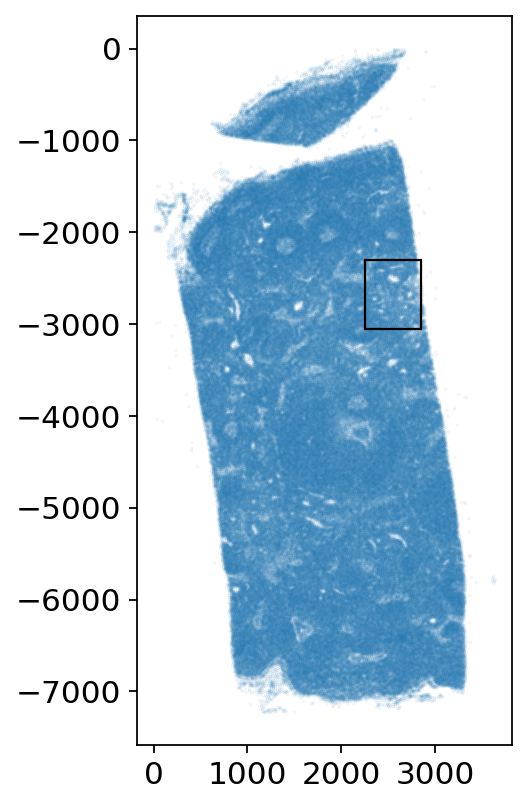

In [26]:
zoom_x = 2250
zoom_y = -3050

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [27]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

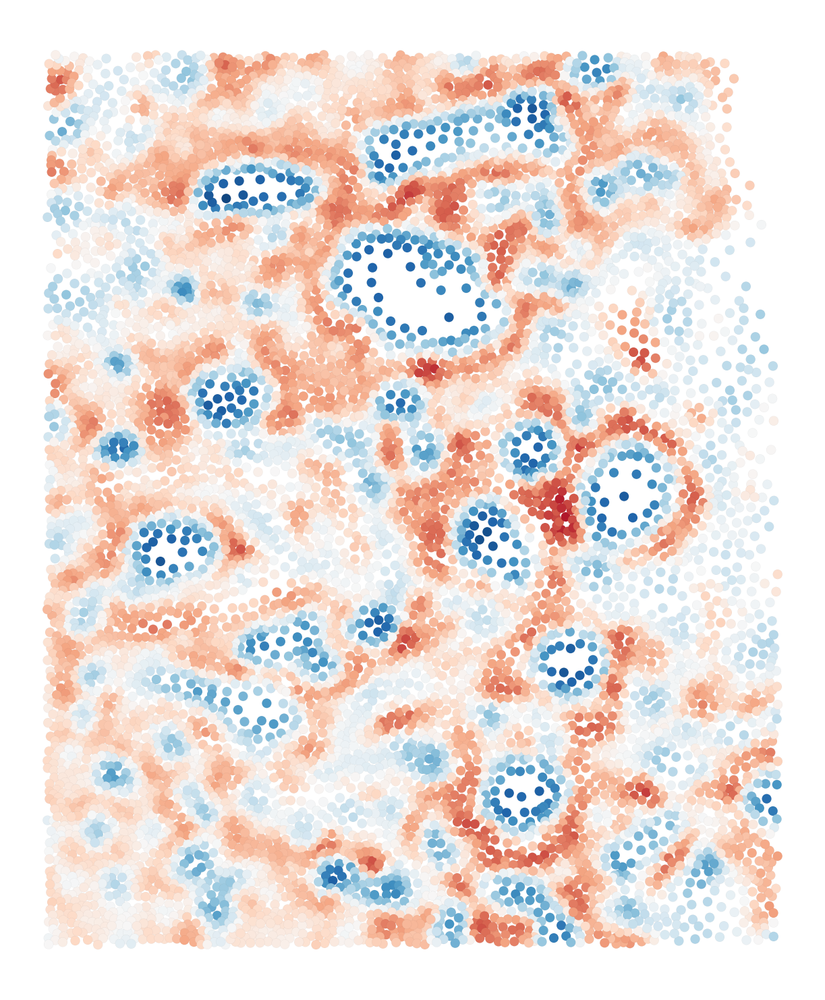

In [31]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=40,
    c=zdata.obs[f'c{i}'].values,
    cmap='RdBu_r',
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'paracrine{i}_zoom.png')
plt.savefig(filename, dpi=dpi)
plt.show()

## Plot PC4 mini zooms

### PC4 mini zooms

In [83]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/12.5
zoom_height = height/10

#### PC1 mini zoom 1

In [84]:
i = 4
c = adata.layers[filter_key] @ V[:,i]
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

minizoomn = 0

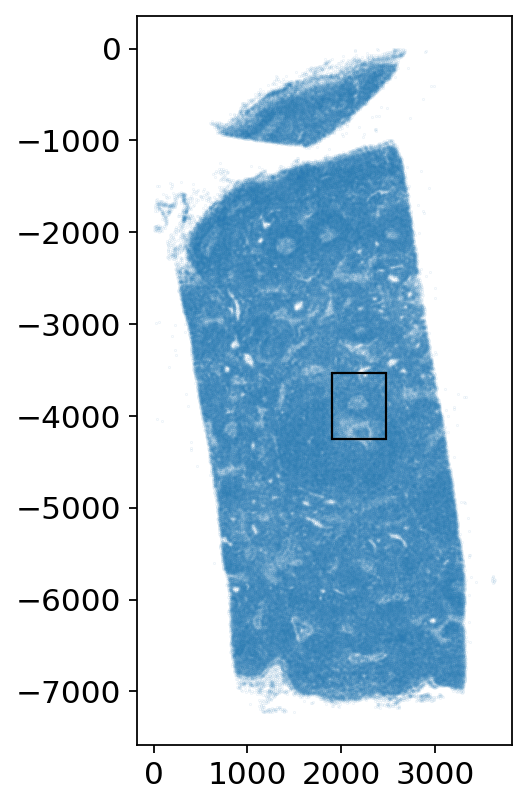

In [85]:
zoom_x = 1900
zoom_y = -4250

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [86]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

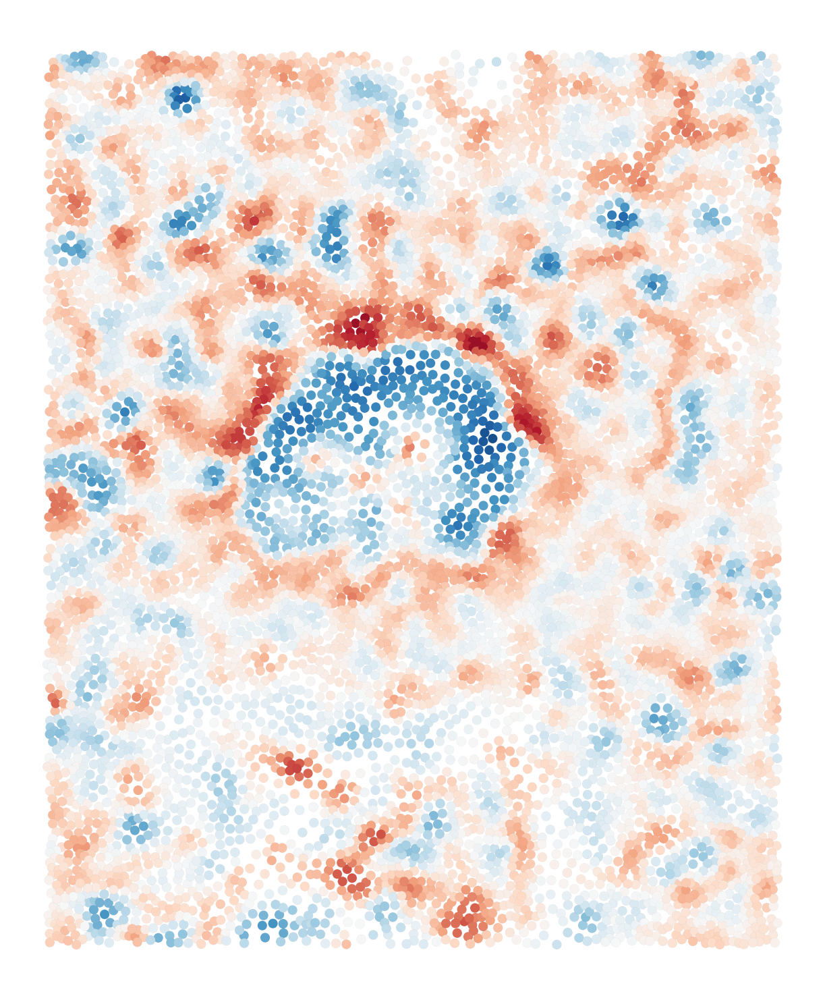

In [87]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=40,
    c=zdata.obs[f'c{i}'].values,
    cmap='RdBu_r',
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'paracrine{i}_minizoom{minizoomn}.png')
plt.savefig(filename, dpi=dpi)
plt.show()

#### PC6 mini zoom 2

In [88]:
i = 4
c = adata.layers[filter_key] @ V[:,i]
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

minizoomn = 1

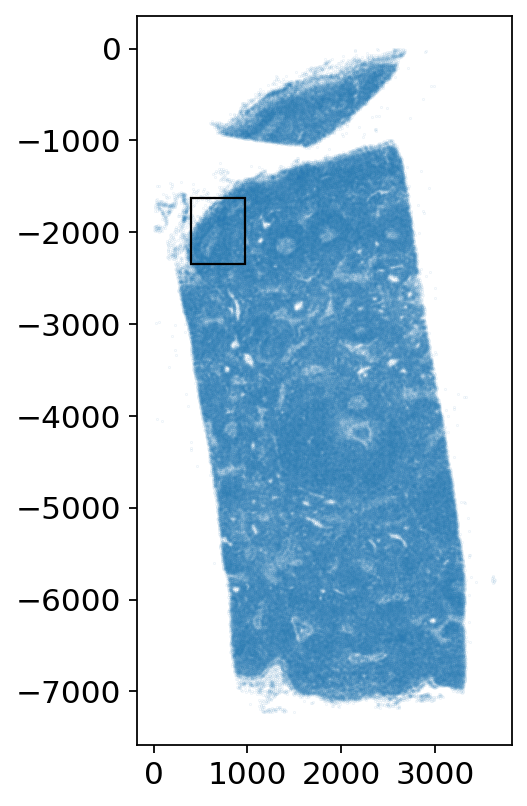

In [89]:
zoom_x = 400
zoom_y = -2350

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [90]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

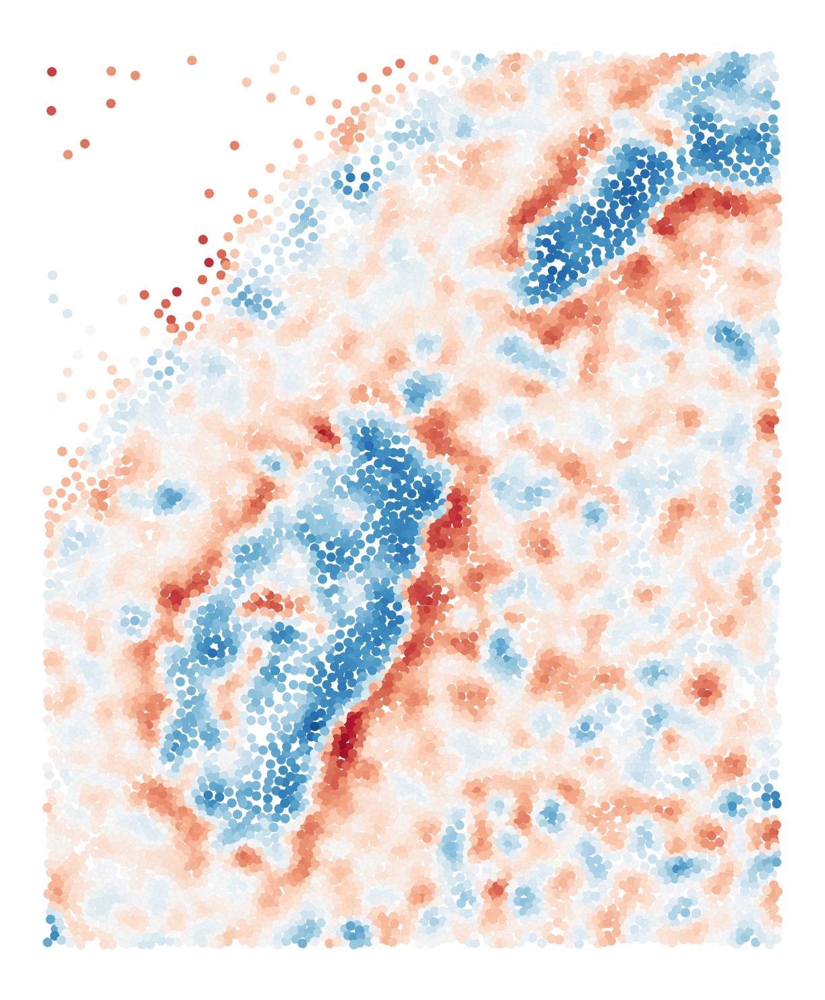

In [92]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=40,
    c=zdata.obs[f'c{i}'].values,
    cmap='RdBu_r',
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'paracrine{i}_minizoom{minizoomn}.png')
plt.savefig(filename, dpi=dpi)
plt.show()

#### PC6 mini zoom 3

In [94]:
minizoomn = 2

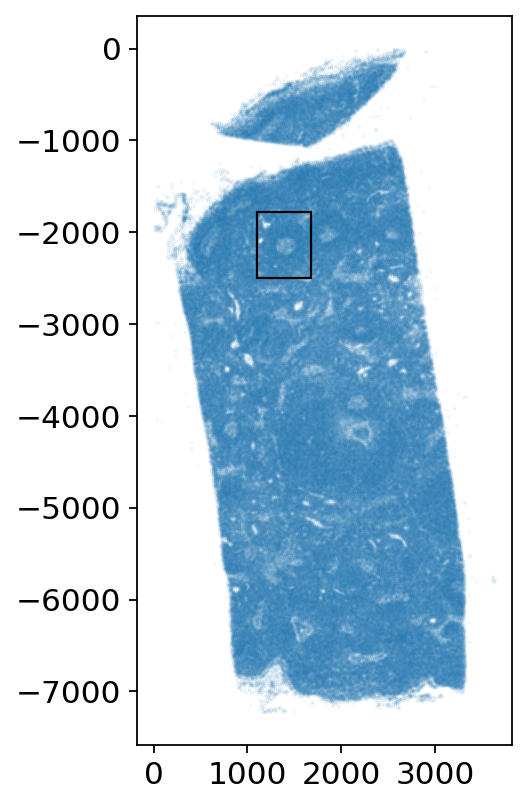

In [95]:
zoom_x = 1100
zoom_y = -2500

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [96]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

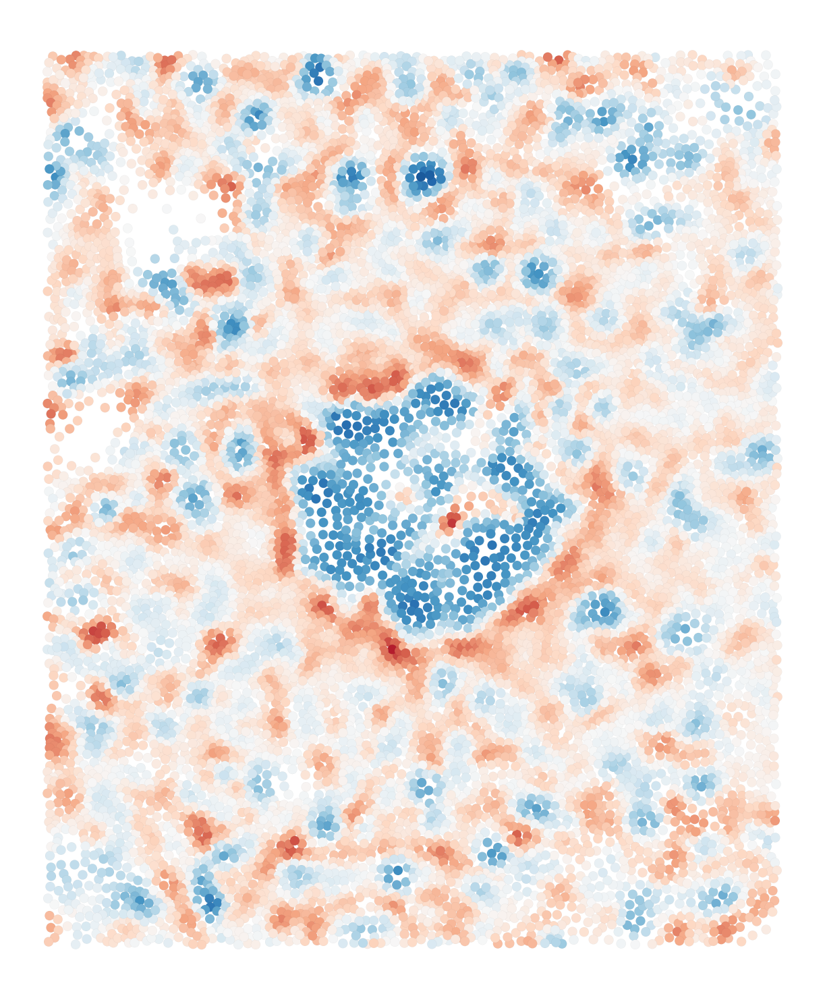

In [97]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=40,
    c=zdata.obs[f'c{i}'].values,
    cmap='RdBu_r',
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'paracrine{i}_minizoom{minizoomn}.png')
plt.savefig(filename, dpi=dpi)
plt.show()

#### PC6 mini zoom 4

In [98]:
minizoomn = 3

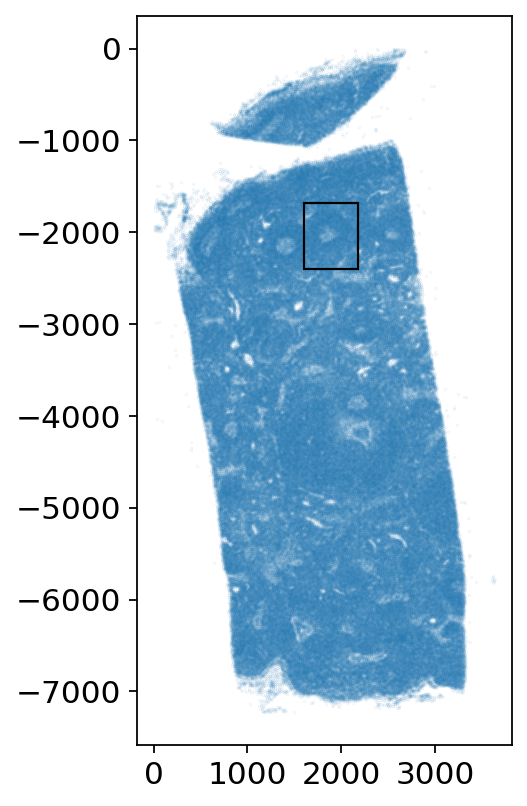

In [99]:
zoom_x = 1600
zoom_y = -2400

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [100]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

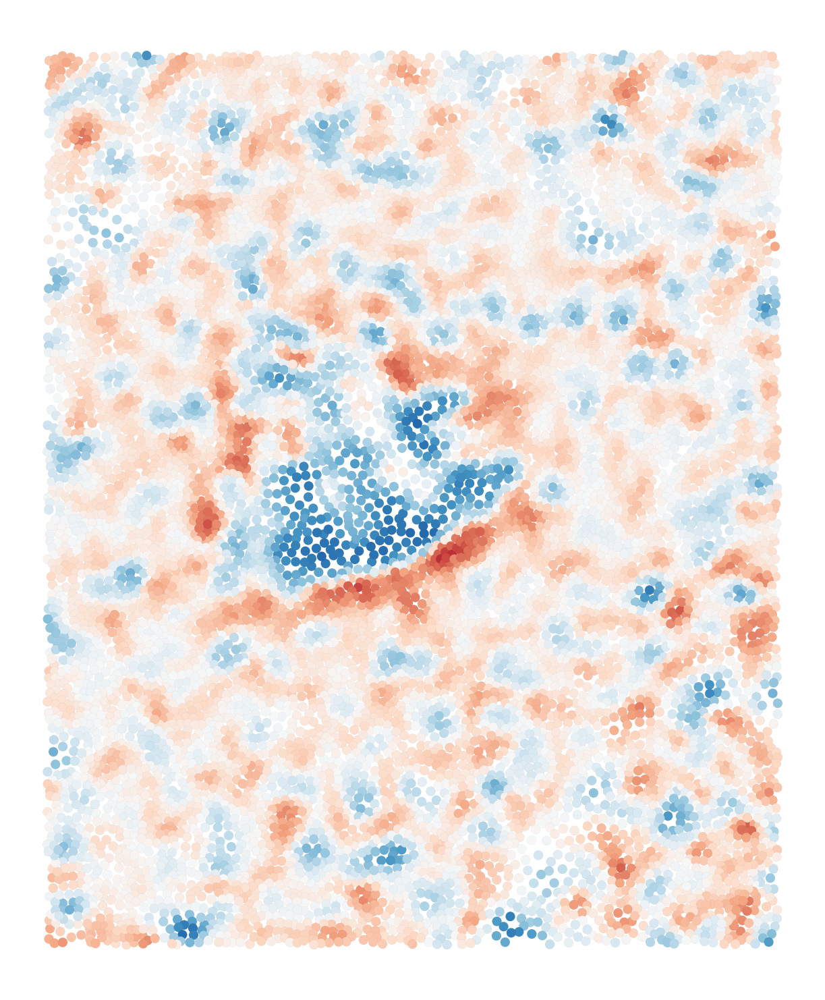

In [101]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=40,
    c=zdata.obs[f'c{i}'].values,
    cmap='RdBu_r',
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'paracrine{i}_minizoom{minizoomn}.png')
plt.savefig(filename, dpi=dpi)
plt.show()